In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torch.utils.data import sampler
from utils.dataset import *

import torchvision.datasets as dset
import torchvision.transforms as T

import numpy as np
import random
import json
import os
from collections import Counter
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
#wiekszosc g3 chyba mozna wywalic
#jest 180k znaków w train, z czego 122k to other sign :c

In [2]:
train = read_list_from_file('/mnt/CommonData/dataset/mtsd_fully_annotated/splits/train.txt')
ann_d="/mnt/CommonData/dataset/filtered_annotations_2/"
annotations = get_annotations(train, ann_d)
#test_annotations = get_annotations(test)


KeyboardInterrupt: 

In [ ]:
def get_labels(annots):
    labels = []
    for img in annots:
        for obj in annots[img]['objects']:
            labels.append(obj['label'])
    labels_with_counts = Counter(labels)
    return labels_with_counts


labels = get_labels(annotations)
label_names = list(labels.keys())

In [4]:
%matplotlib inline
def get_x_imgs(label,x):
    imgs = []
    annots = list(annotations.keys())
    random.shuffle(annots)
    for annot in annots:
        for obj in annotations[annot]['objects']:
            if obj['label'] == label:
                img= mpimg.imread('/mnt/CommonData/dataset/mtsd_fully_annotated/images/' + annot + '.jpg')
                bbox = obj['bbox']
                img = img[int(bbox['ymin']):int(bbox['ymax']), int(bbox['xmin']): int(bbox['xmax']),:]
                imgs.append(img)
                if(len(imgs) >= x):
                    return imgs
    return imgs

def disp_12_imgs(imgs):
    fig=plt.figure(figsize=(10, 3))
    columns = 8
    rows = 1
    for i in range(1, columns*rows +1):
        fig.add_subplot(rows, columns, i)
        plt.imshow(imgs[min(i-1,len(imgs)-1)])
    plt.show()

information--airport--g1
102


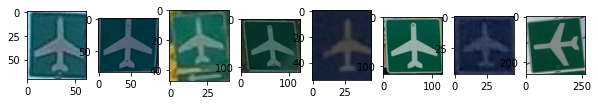

information--dead-end--g1
126


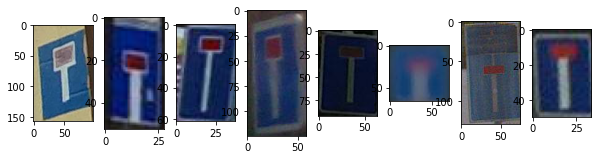

information--disabled-persons--g1
214


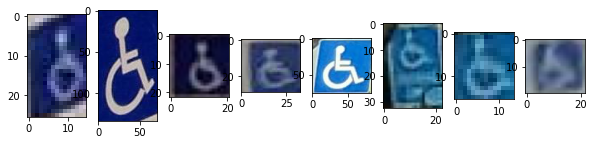

information--end-of-built-up-area--g1
54


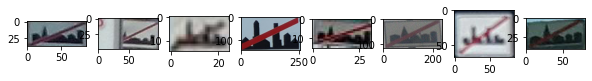

information--end-of-motorway--g1
130


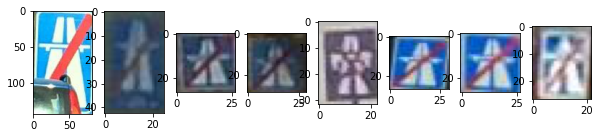

information--highway-exit--g1
85


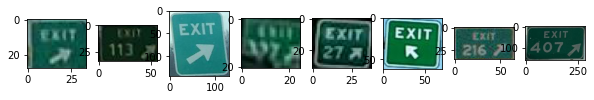

information--living-street--g1
58


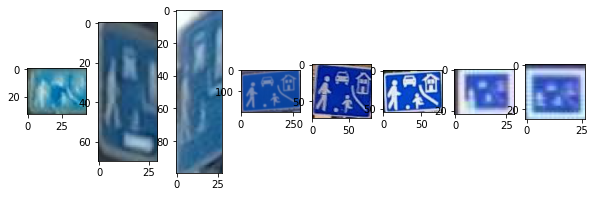

information--motorway--g1
192


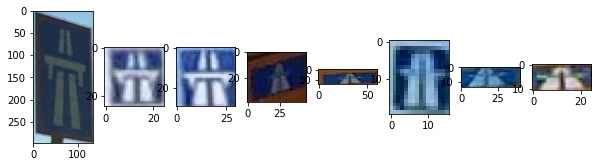

information--parking--g1
1545


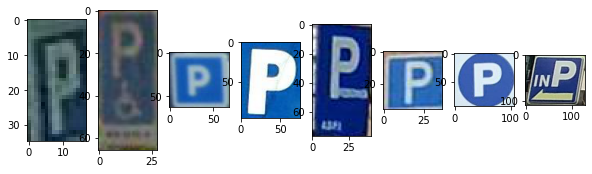

information--pedestrians-crossing--g1
1914


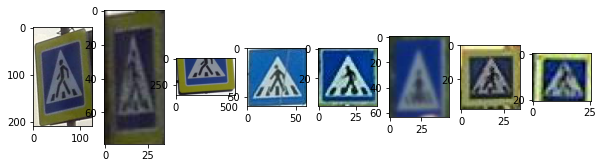

maximum-speed-limit-led--g1
162


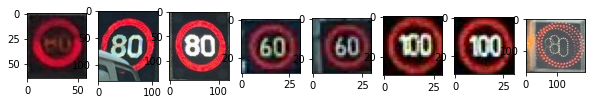

regulatory--bicycles-only--g1
248


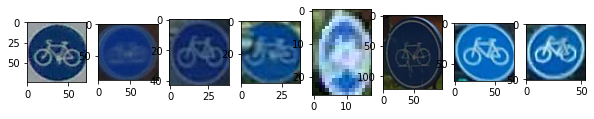

regulatory--dual-lanes
100


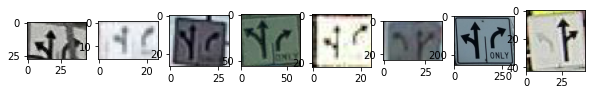

regulatory--end-of-maximum-speed-limit-70--g1
50


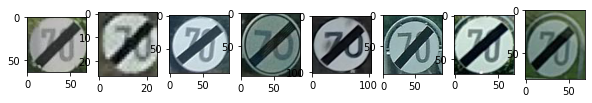

regulatory--end-of-priority-road--g1
79


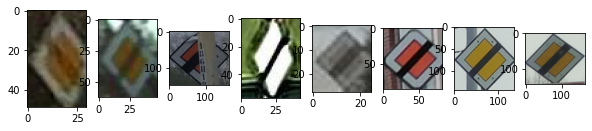

regulatory--end-of-speed-limit-zone--g1
101


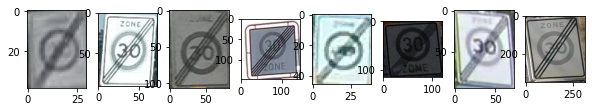

regulatory--go-straight--g1
424


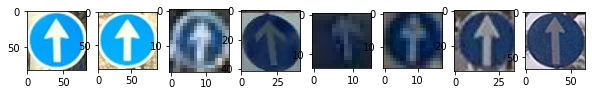

regulatory--go-straight-or-turn-left--g1
133


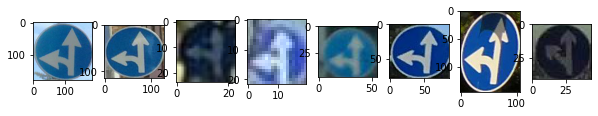

regulatory--go-straight-or-turn-right--g1
114


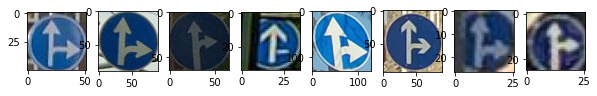

regulatory--height-limit--g1
401


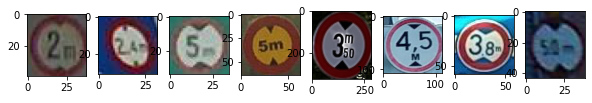

regulatory--keep-left--g1
396


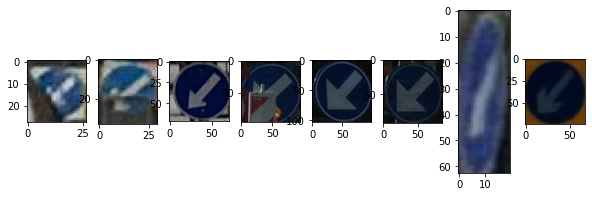

regulatory--keep-right--g1
1077


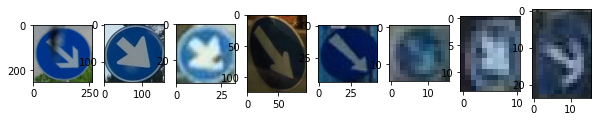

regulatory--keep-right--g4
519


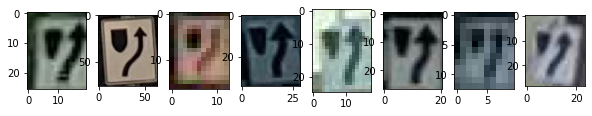

regulatory--maximum-speed-limit-10--g1
96


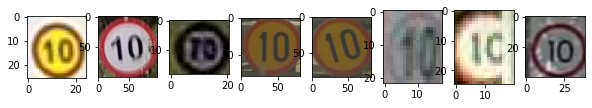

regulatory--maximum-speed-limit-100--g1
169


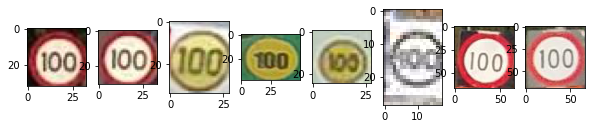

regulatory--maximum-speed-limit-110--g1
105


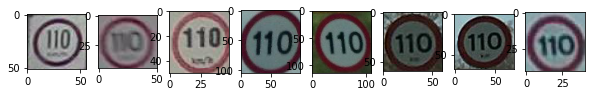

regulatory--maximum-speed-limit-120--g1
94


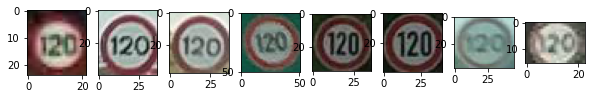

regulatory--maximum-speed-limit-20--g1
195


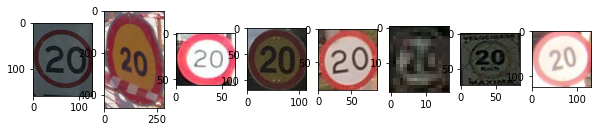

regulatory--maximum-speed-limit-30--g1
648


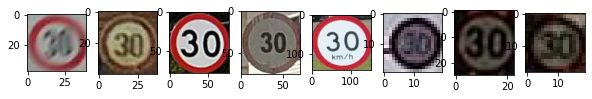

regulatory--maximum-speed-limit-40--g1
855


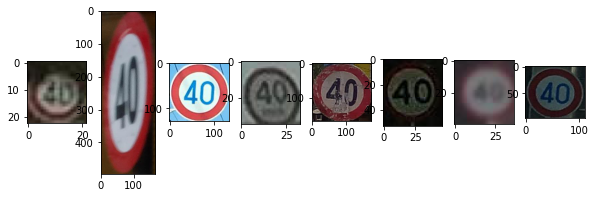

regulatory--maximum-speed-limit-5--g1
94


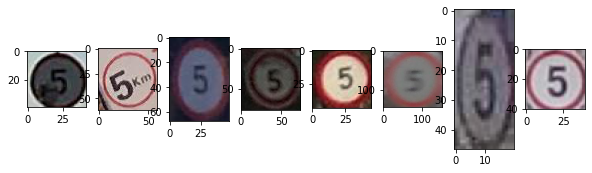

regulatory--maximum-speed-limit-50--g1
612


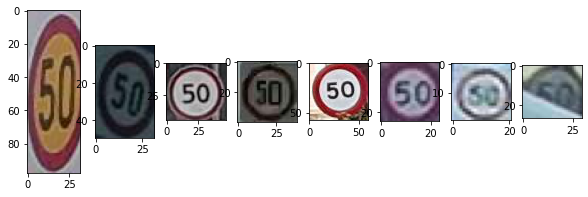

regulatory--maximum-speed-limit-60--g1
567


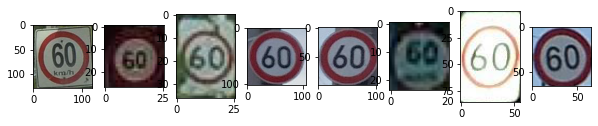

regulatory--maximum-speed-limit-70--g1
296


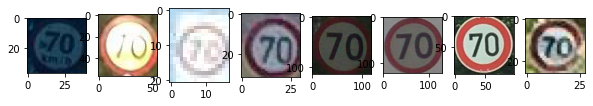

regulatory--maximum-speed-limit-80--g1
358


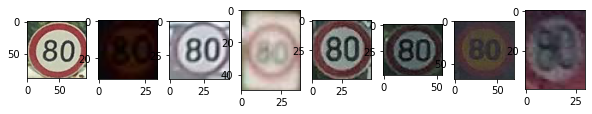

regulatory--maximum-speed-limit-90--g1
222


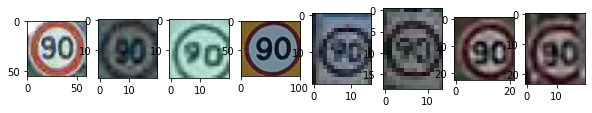

regulatory--mopeds-and-bicycles-only--g1
101


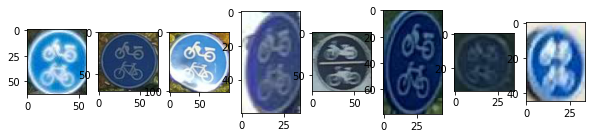

regulatory--no-entry--g1
1768


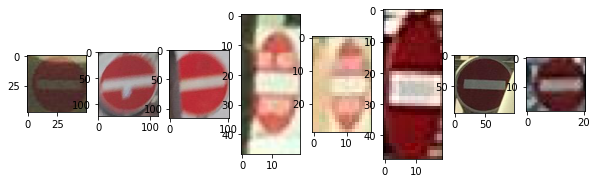

regulatory--no-heavy-goods-vehicles--g1
315


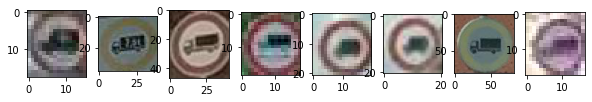

regulatory--no-heavy-goods-vehicles--g2
709


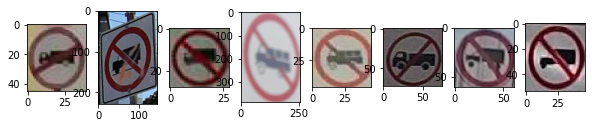

regulatory--no-left-turn--g1
415


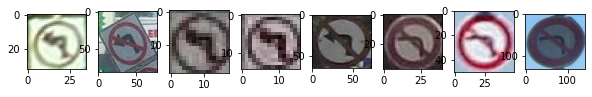

regulatory--no-left-turn--g2
61


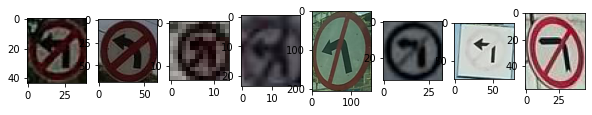

regulatory--no-overtaking--g1
243


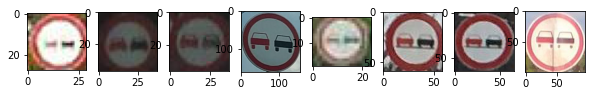

regulatory--no-overtaking--g2
197


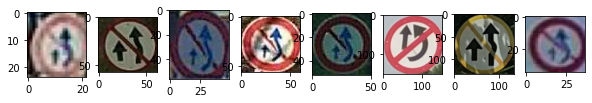

regulatory--no-overtaking--g5
332


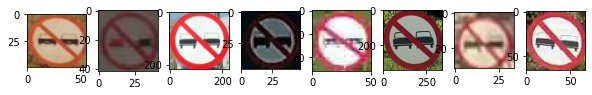

regulatory--no-parking--g1
961


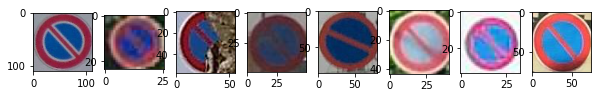

regulatory--no-parking--g2
518


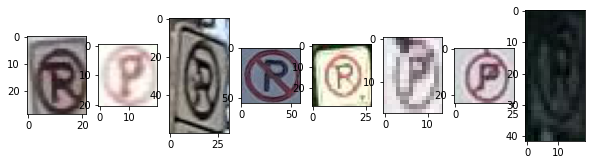

regulatory--no-parking--g5
513


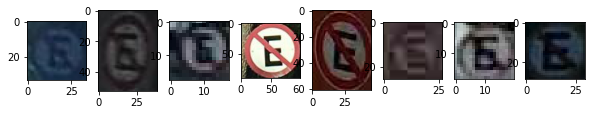

regulatory--no-right-turn--g1
242


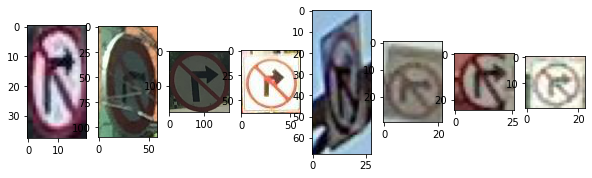

regulatory--no-right-turn--g2
99


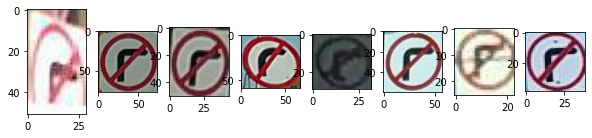

regulatory--no-stopping--g1
982


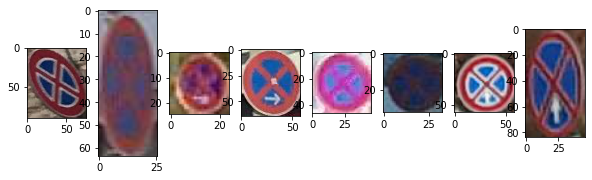

regulatory--no-stopping--g2
247


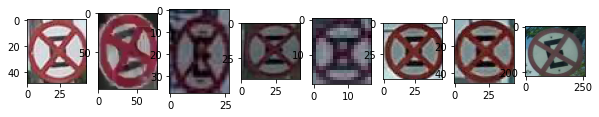

regulatory--no-u-turn--g1
406


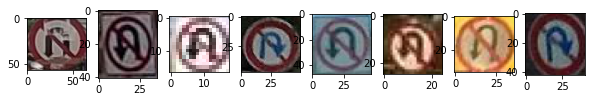

regulatory--no-vehicles-carrying-dangerous-goods--g1
106


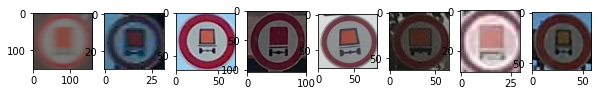

regulatory--one-way-left--g1
299


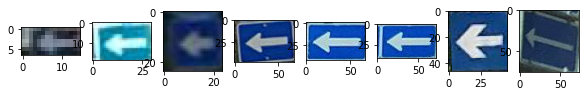

regulatory--one-way-left--g3
294


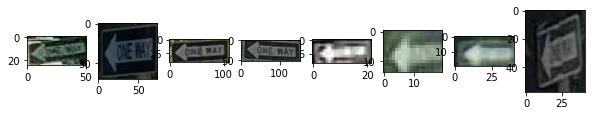

regulatory--one-way-right--g1
241


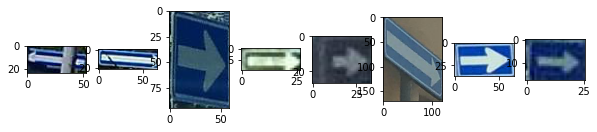

regulatory--one-way-straight--g1
368


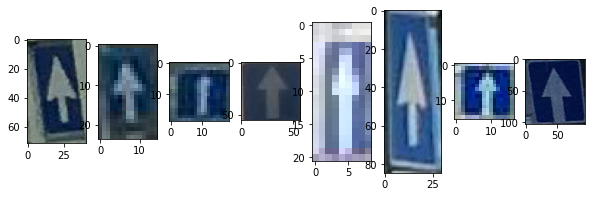

regulatory--pass-on-either-side--g1
274


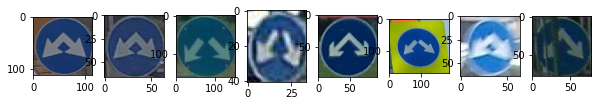

regulatory--pedestrians-only--g1
149


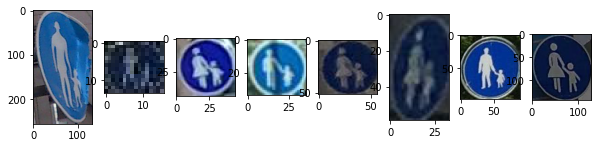

regulatory--priority-over-oncoming-vehicles--g1
102


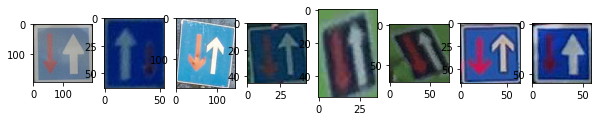

regulatory--priority-road--g1
1014


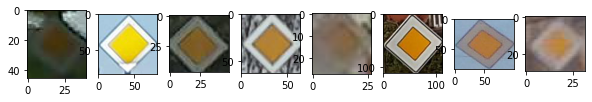

regulatory--reversible-lanes--g2
103


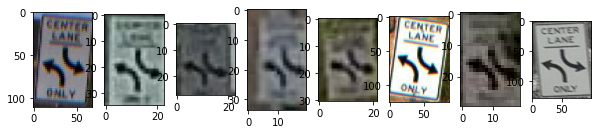

regulatory--road-closed-to-vehicles--g3
236


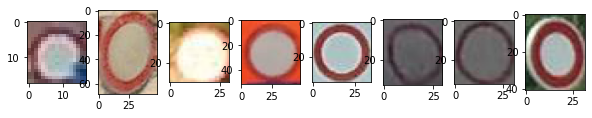

regulatory--roundabout--g1
339


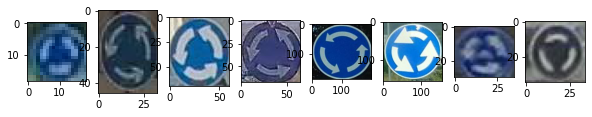

regulatory--shared-path-pedestrians-and-bicycles--g1
211


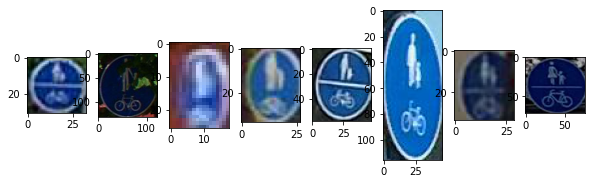

regulatory--stop--g1
1213


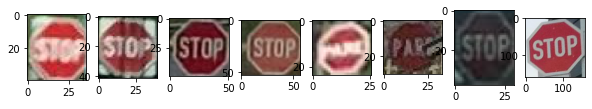

regulatory--turn-left--g1
148


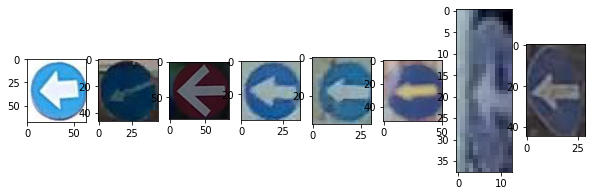

regulatory--turn-left-ahead--g1
107


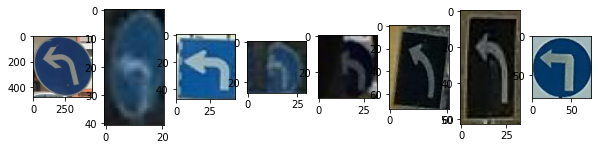

regulatory--turn-right--g1
275


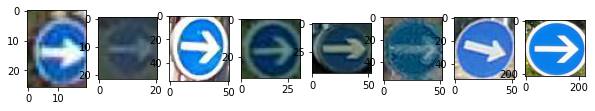

regulatory--turn-right-ahead--g1
157


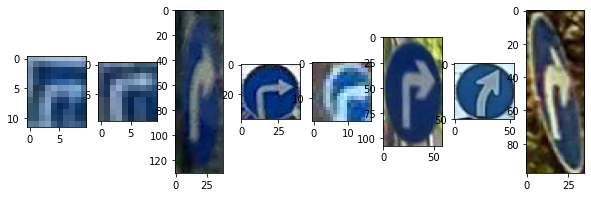

regulatory--weight-limit--g1
190


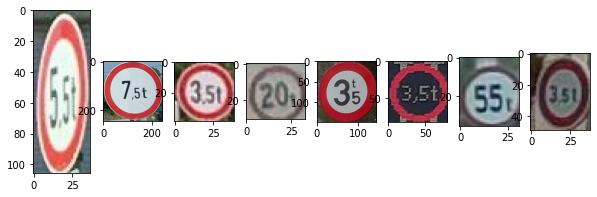

regulatory--yield--g1
2428


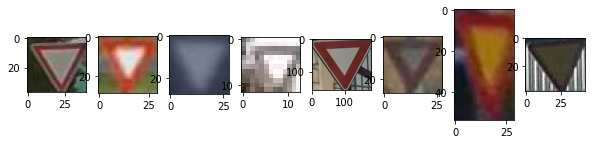

warning--children--g1
219


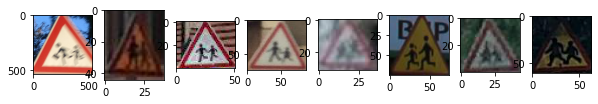

warning--children--g5
274


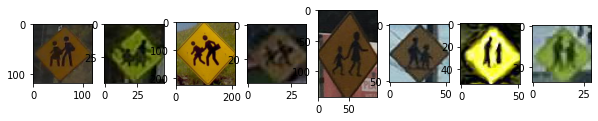

warning--crossroads--g1
164


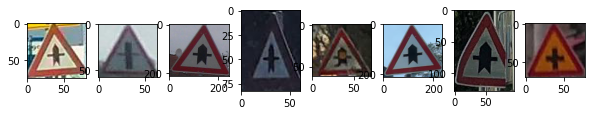

warning--crossroads--g3
152


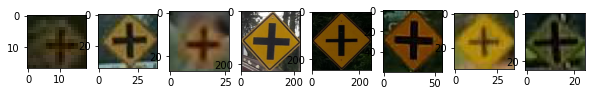

warning--curve-left--g1
212


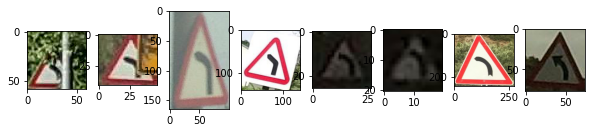

warning--curve-left--g2
500


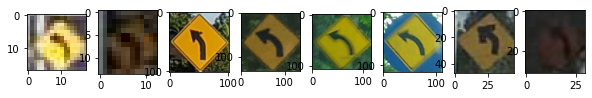

warning--curve-right--g1
238


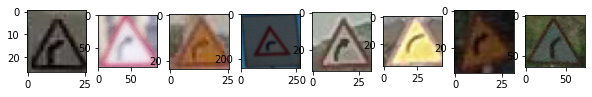

warning--curve-right--g2
408


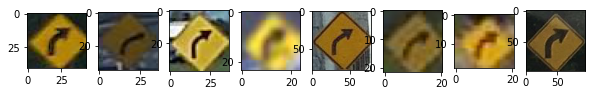

warning--double-curve-first-left--g1
99


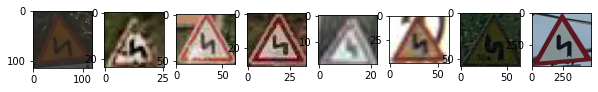

warning--double-curve-first-right--g1
124


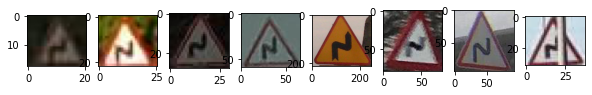

warning--hairpin-curve-right--g1
53


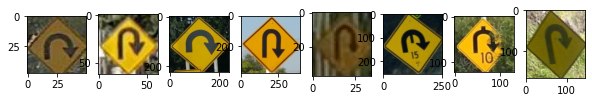

warning--height-restriction--g2
166


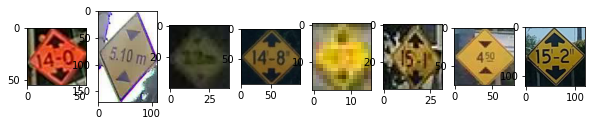

warning--junction-with-a-side-road-perpendicular-left--g3
134


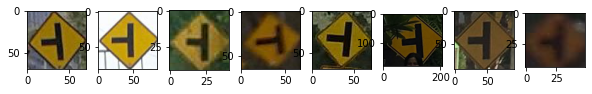

warning--junction-with-a-side-road-perpendicular-right--g3
158


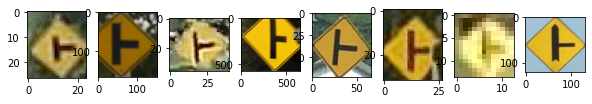

warning--kangaloo-crossing--g1
108


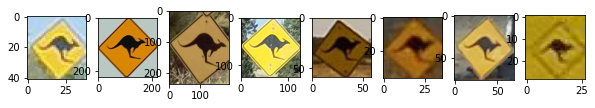

warning--narrow-bridge--g1
164


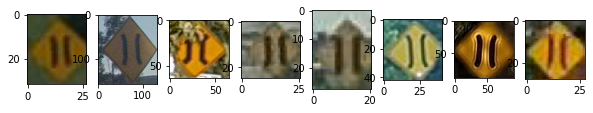

warning--other-danger--g1
355


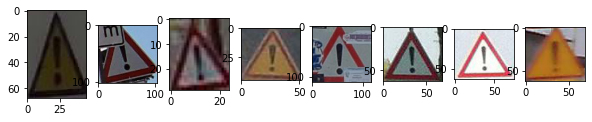

warning--pedestrians-crossing--g1
266


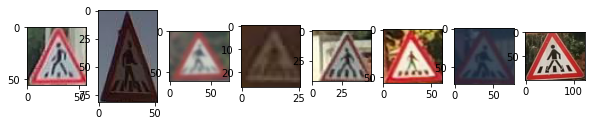

warning--pedestrians-crossing--g4
805


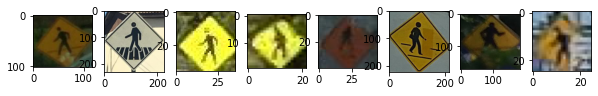

warning--pedestrians-crossing--g5
148


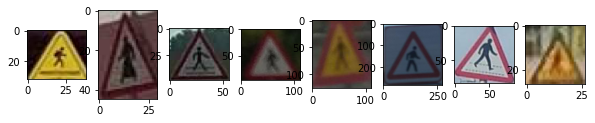

warning--railroad-crossing--g4
261


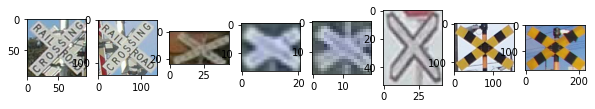

warning--railroad-crossing-with-barriers--g1
90


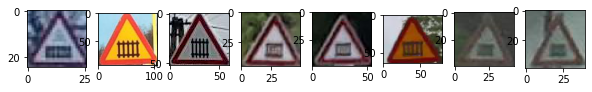

warning--railroad-crossing-without-barriers--g3
134


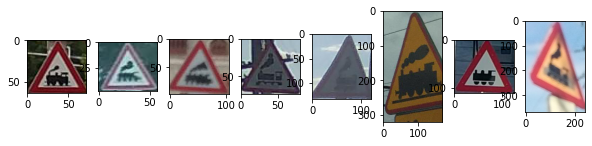

warning--railroad-crossing-without-barriers--g4
136


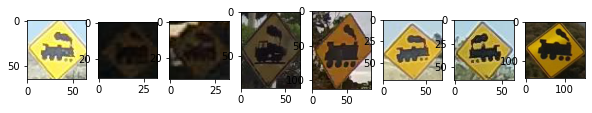

warning--road-bump--g1
373


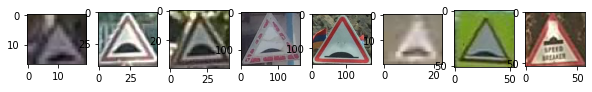

warning--road-bump--g2
479


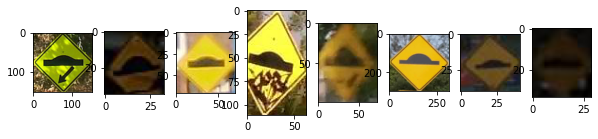

warning--road-narrows--g1
200


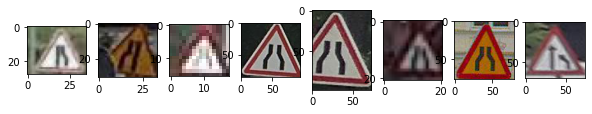

warning--roadworks--g1
298


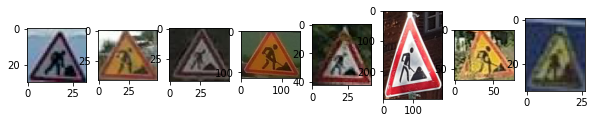

warning--roundabout--g1
131


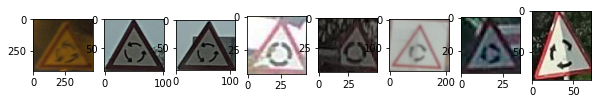

warning--school-zone--g2
236


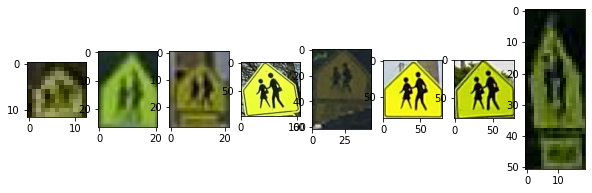

warning--slippery-road-surface--g1
224


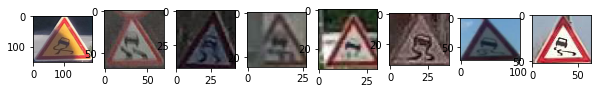

warning--slippery-road-surface--g2
210


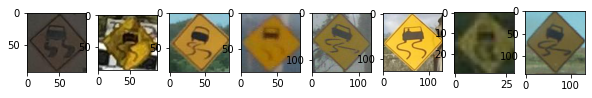

warning--stop-ahead--g1
147


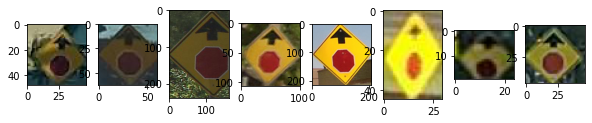

warning--texts--g1
553


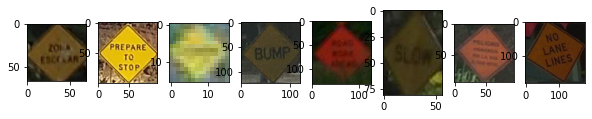

warning--traffic-merges-right--g1
222


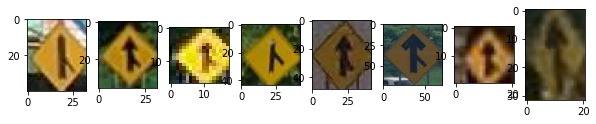

warning--traffic-merges-right--g2
110


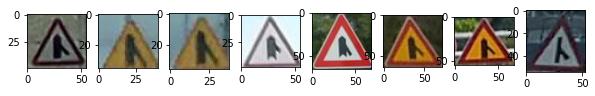

warning--traffic-signals--g1
178


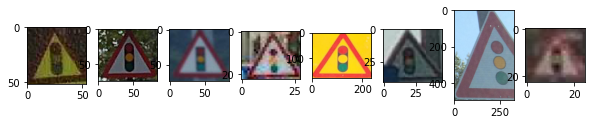

warning--traffic-signals--g3
211


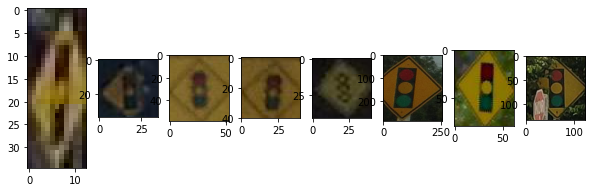

warning--trucks-crossing--g1
117


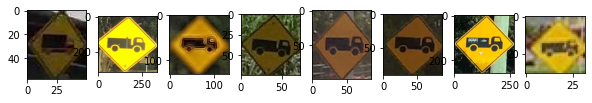

warning--turn-left--g1
110


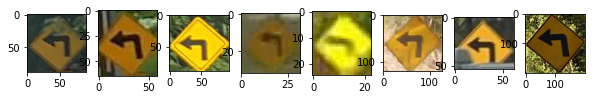

warning--turn-right--g1
186


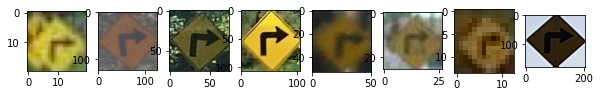

warning--winding-road-first-left--g1
136


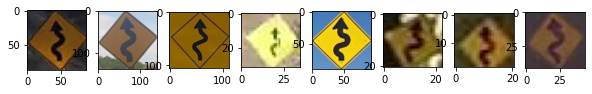

warning--winding-road-first-right--g1
128


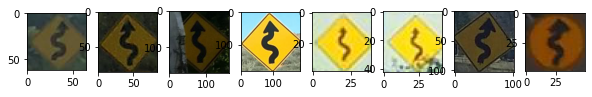

In [6]:
#sorted_labels = train_labels.most_common()

#for lab in sorted(list(filter(lambda l: 'g3' in l, warning_signs))):
for lab in sorted(label_names):
#     lab = sorted_labels[1][0]
    print(lab)
    print(labels[lab])
    imgs = get_x_imgs(lab,8)
    disp_12_imgs(imgs)

In [1]:
symmetrical_signs = set(['information--airport--g1', 
                         'information--dead-end--g1',
                         'information--motorway--g1',
                         'information--pedestrians-crossing--g1',
                         'regulatory--go-straight--g1',
                         'regulatory--no-entry--g1',
                         'regulatory--no-stopping--g1',
                         'regulatory--no-vehicles-carrying-dangerous-goods--g1',
                         'regulatory--one-way-straight--g1',
                         'regulatory--pass-on-either-side--g1',
                         'regulatory--priority-road--g1',
                         'regulatory--road-closed-to-vehicles--g3',
                         'regulatory--roundabout--g1',
                         'regulatory--yield--g1',
                         'warning--children--g5',
                         'warning--crossroads--g1',
                         'warning--crossroads--g3',
                         'warning--narrow-bridge--g1',
                         'warning--other-danger--g1',
                         'warning--pedestrians-crossing--g1',
                         'warning--pedestrians-crossing--g4',
                         'warning--pedestrians-crossing--g5',
                         'warning--railroad-crossing--g4',
                         'warning--railroad-crossing-with-barriers--g1',
                         'warning--road-bump--g1',
                         'warning--road-bump--g2',
                         'warning--road-narrows--g1',
                         'warning--roundabout--g1',
                         'warning--stop-ahead--g1',
                         'warning--traffic-signals--g1',
                         'warning--traffic-signals--g3'
                        ])

In [5]:
with open('./symmetrical_signs.pkl', 'wb') as f:
    pickle.dump(symmetrical_signs, f)

In [2]:
import numpy as np
import imgaug as ia
import imgaug.augmenters as iaa
from imgaug.augmentables.bbs import BoundingBox, BoundingBoxesOnImage
from imgaug.augmentables.heatmaps import HeatmapsOnImage
from imgaug.augmentables.segmaps import SegmentationMapsOnImage
import cv2
from typing import List, Dict

from detectron2.structures import BoxMode

from detectron2.data.transforms import *
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.config import get_cfg

In [3]:
with open('dataset_dicts.pkl', 'rb') as f:
    dataset_dicts = pickle.load(f)

In [4]:
%matplotlib inline

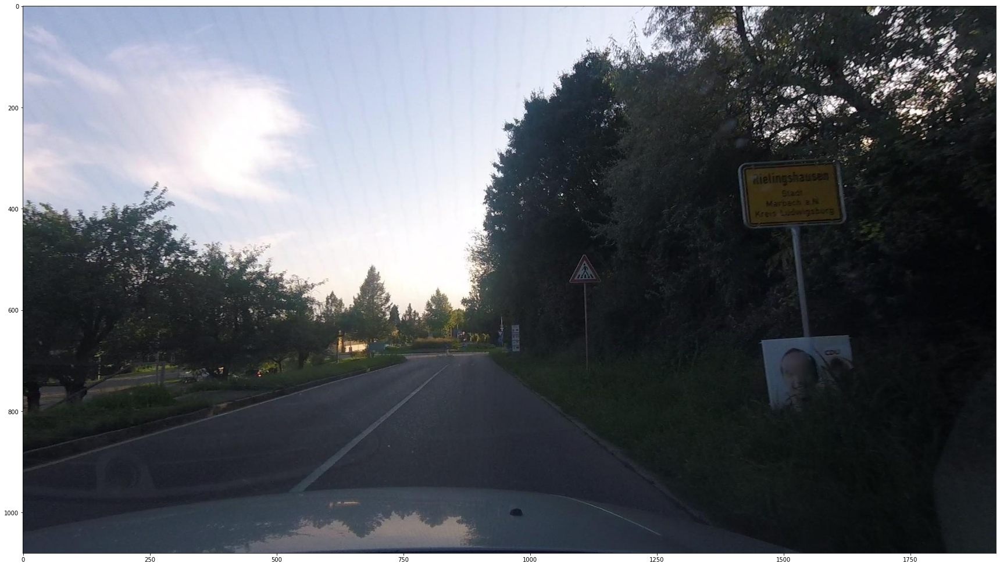

In [5]:
plt.figure(figsize=(30,20))
for d in random.sample(dataset_dicts, 1):
    img = cv2.imread(d["file_name"])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)

In [12]:
aug = RandomRotation([-2, 2], expand=False, center=None, sample_style="range")#RandomCrop("relative_range",[0.65,0.75])
blend = aug.get_transform(img)
tr_img = blend.apply_image(img)

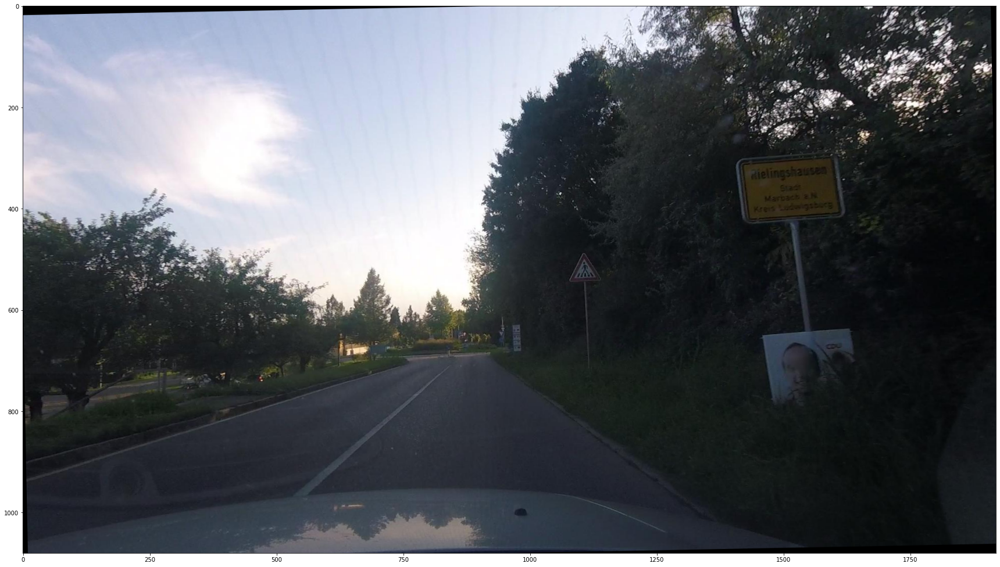

In [13]:
plt.figure(figsize=(30,20))
plt.imshow(tr_img)

In [55]:
tr_img.shape#.reshape(tr_img.shape[2],tr_img.shape[0],tr_img.shape[1]).shape

(636, 1183, 3)

In [94]:
l_id_f="/home/pkos/workspace/inz/praca_inzynierska/lbl_id_map.pkl"
with open(l_id_f, 'rb') as f:
        lbl_id_map = pickle.load(f)
id_l_f="/home/pkos/workspace/inz/praca_inzynierska/id_lbl_map.pkl"
with open(id_l_f, 'rb') as f:
        id_lbl_map = pickle.load(f)
labels = list(lbl_id_map.keys())

In [95]:
ann_d="/mnt/CommonData/dataset/filtered_annotations_2/"
#img_d="/mnt/CommonData/dataset/images/"
#img_d="/mnt/CommonData/dataset/mtsd_fully_annotated/images/"
img_d="/home/pkos/Desktop/mtsd_fully_annotated/images"
for d in ["train", "val"]:
    #id_f="/mnt/CommonData/dataset/splits/"+ d +".txt"
    #id_f="/mnt/CommonData/dataset/mtsd_fully_annotated/splits/"+ d +".txt"
    id_f="/home/pkos/Desktop/mtsd_fully_annotated/splits/" + d +".txt"
    
    if d=="train":
        DatasetCatalog.register("MTSD_"+d, 
                            lambda id_f=id_f, ann_d=ann_d, img_d=img_d, l_id_f=l_id_f: 
                                prepare_MTSD_for_detectron(id_f, ann_d, img_d, l_id_f))
    else:
        DatasetCatalog.register("MTSD_"+d, 
                            lambda id_f=id_f, ann_d=ann_d, img_d=img_d, l_id_f=l_id_f: 
                                prepare_MTSD_for_detectron(id_f, ann_d, img_d, l_id_f))
    MetadataCatalog.get("MTSD_" + d).set(thing_classes=labels)
    
signs_metadata = MetadataCatalog.get("MTSD_train")
#later, to access the data:
#data: List[Dict] = DatasetCatalog.get("my_dataset")

In [96]:
cfg = get_cfg()
cfg.merge_from_file("./config.yml")

In [97]:
from utils.trainer import MTSDDatasetMapper
mapper = MTSDDatasetMapper(cfg, True)

(1080, 1920, 3)


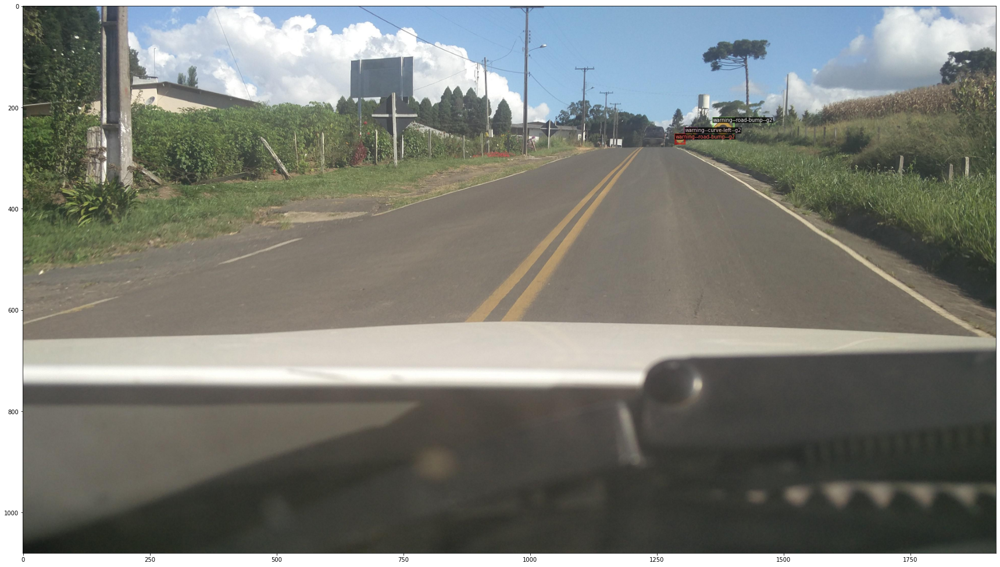

In [132]:
%matplotlib inline
plt.figure(figsize=(30,20))
l =0
while(l == 0):
    d = random.sample(dataset_dicts, 1)[0]
    img = cv2.imread(d["file_name"])
    #img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    l = len(d['annotations'])
visualizer = Visualizer(img[:, :, ::-1], metadata=signs_metadata, scale=0.5)
out = visualizer.draw_dataset_dict(d)
plt.imshow(out.get_image())
print(out.get_image().shape)
#plt.imshow(img)

In [17]:
d

{'file_name': '/mnt/CommonData/dataset/mtsd_fully_annotated/images/uWzcRhnFQc_oQX1bEJaTag.jpg',
 'image_id': 'uWzcRhnFQc_oQX1bEJaTag',
 'height': 3000,
 'width': 4000,
 'annotations': [{'bbox': [3613.28125,
    109.86328125,
    3999.0234375,
    780.76171875],
   'bbox_mode': <BoxMode.XYXY_ABS: 0>,
   'category_id': 91}]}

In [45]:
for annot in d['annotations']:
    print(annot['category_id'])

45
45
69
73
56


In [52]:
mapped_d = mapper(d)
img = mapped_d['image'].numpy().transpose(1,2,0)
#     img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
visualizer = Visualizer(img[:, :, ::-1], metadata=signs_metadata, scale=0.5)
out = visualizer.draw_dataset_dict(mapped_d)
plt.imshow(out.get_image())

In [41]:
for d in random.sample(dataset_dicts, 1):
    mapped_d = mapper(d)
    img = mapped_d['image']
#     img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    visualizer = Visualizer(img[:, :, ::-1], metadata=signs_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(mapped_d)
    plt.imshow(out.get_image())

ValueError: step must be greater than zero